<a href="https://colab.research.google.com/github/Francisc17/Hearth-Disease-Interpretability-Research/blob/main/%5BMost_Recent%5D_Reseach_Hearth_Disease_study_ipynb_txt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  <span style="color:orange">Hearth Disease Study</span>

# 1.0 Getting the Data and make some pre-processing steps 

In [ ]:
#Clean in memory variables

%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [ ]:
!python --version

Python 3.7.13


In [ ]:
#!pip install pycaret[full]
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
dataset = pd.read_csv('/content/drive/MyDrive/heart_statlog_cleveland_hungary_final.csv')

dataset.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
0,40,1,2,140,289,0,0,172,0,0.0,1,0
1,49,0,3,160,180,0,0,156,0,1.0,2,1
2,37,1,2,130,283,0,1,98,0,0.0,1,0
3,48,0,4,138,214,0,0,108,1,1.5,2,1
4,54,1,3,150,195,0,0,122,0,0.0,1,0


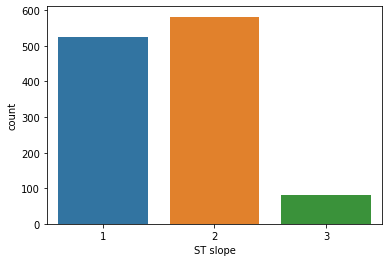

In [ ]:
#REMOVE INVALID VALUE ON ST SLOPE FEATURE

import matplotlib.pyplot as plt
import seaborn as sns

#Only one instance - we can drop it...
dataset.drop(dataset[dataset["ST slope"] == 0].index,axis=0,inplace=True)

sns.countplot(x = "ST slope", data=dataset);

In [ ]:
#check the shape of data
dataset.shape

(1189, 12)

In [ ]:
#!pip install numpy --upgrade

#solve Jinja2 dependency
!pip install markupsafe==2.0.1
!pip install Jinja2

import jinja2

from pycaret.classification import *

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached MarkupSafe-2.0.1-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (31 kB)
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires markupsafe~=2.1.1, but you have markupsafe 2.0.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


**Data imputation with regression model**





<AxesSubplot:xlabel='cholesterol', ylabel='age'>

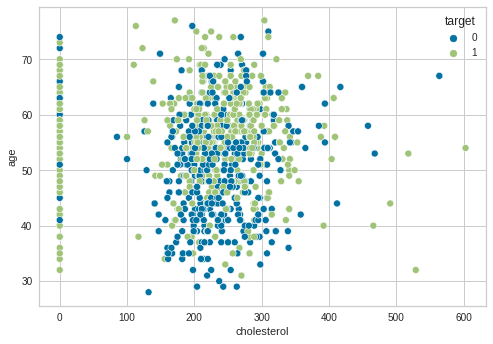

In [ ]:
sns.scatterplot(x = 'cholesterol', y = 'age', hue = 'target', data = dataset)

In [ ]:
cholesterol_train_frame=dataset[dataset['cholesterol']>0].copy()
cholesterol_prediction=dataset[dataset['cholesterol']<=0].copy()

print(cholesterol_train_frame.shape)
print(cholesterol_prediction.shape)

(1017, 12)
(172, 12)


<AxesSubplot:xlabel='cholesterol', ylabel='age'>

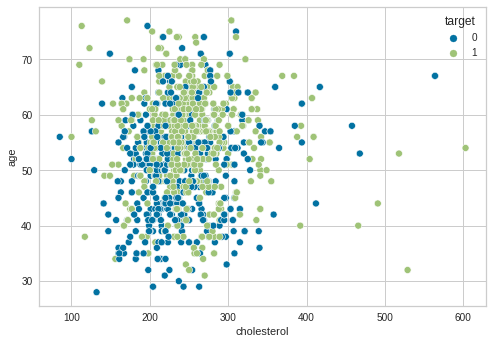

In [ ]:
#Regression model to fill invalid cholesterol data

from sklearn.ensemble import RandomForestRegressor

cholesterol_model = RandomForestRegressor(n_estimators=40, min_samples_leaf=3,
                                                   max_features=0.5,
                                                   n_jobs=-1,
                                                   oob_score=True,max_depth=12)

cholesterol_x= cholesterol_train_frame.drop('cholesterol',axis=1)
cholesterol_y= cholesterol_train_frame.cholesterol.values
cholesterol_model.fit(cholesterol_x, cholesterol_y)
cholesterol_prediction['cholesterol']=cholesterol_model.predict(cholesterol_prediction.drop('cholesterol',axis=1))

dataset=cholesterol_train_frame.append(cholesterol_prediction)
sns.scatterplot(x = 'cholesterol', y = 'age', hue = 'target', data = dataset)


In [ ]:
print(dataset.duplicated().sum())

272


In [ ]:
#Verification of duplicated data
print('Duplicated dataset: ',dataset.shape)
dataset.drop_duplicates(inplace=True)
print('Dataset after drop duplicates: ',dataset.shape)

Duplicated dataset:  (1189, 12)
Dataset after drop duplicates:  (917, 12)


In [ ]:
data = dataset.sample(frac=0.95, random_state=786)
data_unseen = dataset.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

Data for Modeling: (871, 12)
Unseen Data For Predictions (46, 12)


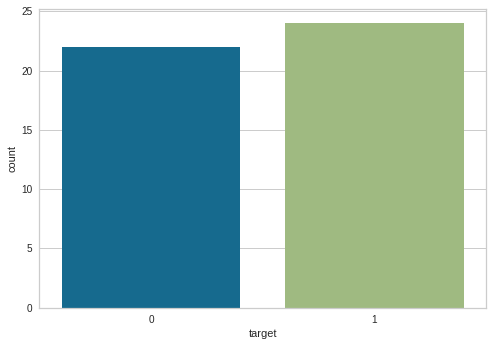

In [ ]:
sns.countplot(x = "target", data=data_unseen);

In [ ]:
data_unseen

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
0,39,1,3,120,339.000000,0,0,170,0,0.0,1,0
1,36,1,3,112,340.000000,0,0,184,0,1.0,2,0
2,39,1,3,160,147.000000,1,0,160,0,0.0,1,0
3,46,1,4,110,240.000000,0,1,140,0,0.0,1,0
4,56,1,4,170,388.000000,0,1,122,1,2.0,2,1
5,54,1,4,140,216.000000,0,0,105,0,1.5,2,1
6,46,1,3,120,230.000000,0,0,150,0,0.0,1,0
7,42,1,3,160,147.000000,0,0,146,0,0.0,1,0
8,56,1,3,130,276.000000,0,0,128,1,1.0,1,0
9,40,1,3,130,281.000000,0,0,167,0,0.0,1,0


**Explaine some functions on setup below:**

**ignore_low_variance:** When set to True, all categorical features with statistically insignificant variances are removed from the dataset.

**remove_multicolinearity:** Variables that have a high dependence between each other will be removed.

**transformation:** Will transform data to have a more linear distribution.

In [ ]:
exp_clf102 = setup(data = data, target = 'target',
                  normalize = True, 
                  transformation = True, 
                  ignore_low_variance = True,
                  remove_outliers = True,
                  fix_imbalance = True,
                  remove_multicollinearity = True,
                  log_experiment = True, 
                  experiment_name = 'heartdisease')

,Description,Value
0,session_id,7220
1,Target,target
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(871, 12)"
5,Missing Values,False
6,Numeric Features,5
7,Categorical Features,6
8,Ordinal Features,False
9,High Cardinality Features,False


2022/06/13 09:28:36 INFO mlflow.tracking.fluent: Experiment with name 'heartdisease' does not exist. Creating a new experiment.


In [ ]:
#SAVE CONFIGURATION

save_config('my_config')

In [ ]:
from pycaret.classification import load_config
load_config('my_config')

FileNotFoundError: ignored

In [ ]:
#Percentage of each sex type - Very much imbalanced!
countFemale = len(data[data.sex == 0])
countMale = len(data[data.sex == 1])
print("Number of Female Patients: " + str(countFemale))
print("Number of Male Patients: " + str(countMale))
print("Percentage of Female Patients: {:.2f}%".format((countFemale / (len(data.sex))*100)))
print("Percentage of Male Patients: {:.2f}%".format((countMale / (len(data.sex))*100)))

Number of Female Patients: 186
Number of Male Patients: 685
Percentage of Female Patients: 21.35%
Percentage of Male Patients: 78.65%


In [ ]:
get_config('X_train').columns

Index(['age', 'resting bp s', 'cholesterol', 'max heart rate', 'oldpeak',
       'sex_1', 'chest pain type_1', 'chest pain type_2', 'chest pain type_3',
       'chest pain type_4', 'fasting blood sugar_0', 'resting ecg_0',
       'resting ecg_1', 'resting ecg_2', 'exercise angina_0', 'ST slope_1',
       'ST slope_3'],
      dtype='object')

# 2.0 Comparing All Models

In [ ]:
top3 = compare_models(n_select = 3, sort = 'Recall')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8719,0.9247,0.9049,0.8821,0.8920,0.7343,0.7381,0.528
catboost,CatBoost Classifier,0.8789,0.9350,0.9021,0.8939,0.8970,0.7498,0.7523,2.479
et,Extra Trees Classifier,0.8685,0.9261,0.8993,0.8812,0.8891,0.7275,0.7305,0.478
lightgbm,Light Gradient Boosting Machine,0.8564,0.9168,0.8992,0.8654,0.8802,0.7009,0.7064,0.135
gbc,Gradient Boosting Classifier,0.8616,0.9213,0.8933,0.8747,0.8830,0.7133,0.7158,0.149
xgboost,Extreme Gradient Boosting,0.8356,0.9139,0.8755,0.8523,0.8620,0.6585,0.6631,0.443
nb,Naive Bayes,0.8529,0.9125,0.8727,0.8765,0.8743,0.6969,0.6977,0.026
ridge,Ridge Classifier,0.8581,0.0000,0.8607,0.8933,0.8762,0.7100,0.7116,0.023
lda,Linear Discriminant Analysis,0.8581,0.9336,0.8607,0.8933,0.8762,0.7100,0.7116,0.026
knn,K Neighbors Classifier,0.8547,0.9029,0.8579,0.8909,0.8731,0.7031,0.7062,0.128


In [ ]:
type(top3)

list

In [ ]:
print(top3)

[RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=2701, verbose=0,
                       warm_start=False), <catboost.core.CatBoostClassifier object at 0x7f9050467790>, ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0

# 2.0 Create Models

### 2.1 Create Models

In [ ]:
catboost = create_model('catboost', fold = 10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8966,0.8946,0.9412,0.8889,0.9143,0.7841,0.7862
1,0.8966,0.9583,0.9706,0.8684,0.9167,0.7814,0.7898
2,0.9138,0.9657,0.8824,0.9677,0.9231,0.8255,0.8301
3,0.8793,0.9105,0.9118,0.8857,0.8986,0.7497,0.7502
4,0.8966,0.9583,0.9118,0.9118,0.9118,0.7868,0.7868
5,0.8793,0.9338,0.8824,0.9091,0.8955,0.7527,0.7532
6,0.8103,0.8934,0.8824,0.8108,0.8451,0.6017,0.6053
7,0.8621,0.9338,0.9118,0.8611,0.8857,0.7122,0.7140
8,0.9474,0.9823,0.9394,0.9688,0.9538,0.8927,0.8932


In [ ]:
rf = create_model('rf', fold = 10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8621,0.8983,0.8824,0.8824,0.8824,0.7157,0.7157
1,0.8966,0.9479,0.9706,0.8684,0.9167,0.7814,0.7898
2,0.9310,0.9841,0.9118,0.9688,0.9394,0.8596,0.8617
3,0.8621,0.8922,0.9412,0.8421,0.8889,0.7085,0.7162
4,0.9310,0.9645,0.9412,0.9412,0.9412,0.8578,0.8578
5,0.8276,0.9154,0.8824,0.8333,0.8571,0.6402,0.6419
6,0.8103,0.8664,0.8824,0.8108,0.8451,0.6017,0.6053
7,0.8966,0.9185,0.9706,0.8684,0.9167,0.7814,0.7898
8,0.9123,0.9735,0.8788,0.9667,0.9206,0.8231,0.8278


In [ ]:
et = create_model('et', fold = 10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8448,0.8824,0.8824,0.8571,0.8696,0.6782,0.6786
1,0.9138,0.9314,0.9706,0.8919,0.9296,0.8190,0.8239
2,0.8793,0.9700,0.8529,0.9355,0.8923,0.7557,0.7599
3,0.8793,0.9069,0.9412,0.8649,0.9014,0.7466,0.7510
4,0.9483,0.9589,0.9412,0.9697,0.9552,0.8940,0.8946
5,0.8103,0.8995,0.8235,0.8485,0.8358,0.6114,0.6118
6,0.7931,0.8903,0.8824,0.7895,0.8333,0.5628,0.5689
7,0.8621,0.9430,0.9412,0.8421,0.8889,0.7085,0.7162
8,0.9123,0.9697,0.9091,0.9375,0.9231,0.8211,0.8216


# 3.0 Tune Models

## Sklearn optimization

In [ ]:
#choose_better returns the original model if tunned model does not improve
sklearn_tuned_catboost, tuner = tune_model(catboost, optimize = 'Recall', choose_better = True, fold = 10, return_tuner=True)

print(tuner)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8448,0.8811,0.8824,0.8571,0.8696,0.6782,0.6786
1,0.9138,0.9424,0.9412,0.9143,0.9275,0.8212,0.8217
2,0.9138,0.9730,0.8824,0.9677,0.9231,0.8255,0.8301
3,0.8621,0.9118,0.9118,0.8611,0.8857,0.7122,0.7140
4,0.9483,0.9718,0.9412,0.9697,0.9552,0.8940,0.8946
5,0.8793,0.9191,0.9118,0.8857,0.8986,0.7497,0.7502
6,0.8276,0.8701,0.9118,0.8158,0.8611,0.6357,0.6425
7,0.8448,0.9105,0.9118,0.8378,0.8732,0.6742,0.6782
8,0.9298,0.9710,0.9091,0.9677,0.9375,0.8577,0.8599


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=Pipeline(steps=[('fix_imbalance',
                                              SMOTE(random_state=2701)),
                                             ('actual_estimator',
                                              <catboost.core.CatBoostClassifier object at 0x7fb75868ae90>)]),
                   n_jobs=-1,
                   param_distributions={'actual_estimator__depth': [1, 2, 3, 4,
                                                                    5, 6, 7, 8,
                                                                    9, 10, 11],
                                        'actual_estimator__eta': [1e-07, 1e-0...
                                        'actual_estimator__l2_leaf_reg': [1, 2,
                                                                          3, 4,
                                                                          5, 6,
           

In [ ]:
sklearn_tuned_rf = tune_model(rf, optimize = 'Recall', choose_better = True, fold = 10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8448,0.8946,0.8529,0.8788,0.8657,0.6821,0.6825
1,0.8793,0.9510,0.9706,0.8462,0.9041,0.7434,0.7562
2,0.9138,0.9877,0.9118,0.9394,0.9254,0.8234,0.8239
3,0.8793,0.9081,0.9118,0.8857,0.8986,0.7497,0.7502
4,0.9138,0.9632,0.9412,0.9143,0.9275,0.8212,0.8217
5,0.8448,0.9167,0.9118,0.8378,0.8732,0.6742,0.6782
6,0.8276,0.8836,0.9118,0.8158,0.8611,0.6357,0.6425
7,0.8793,0.9142,0.9412,0.8649,0.9014,0.7466,0.7510
8,0.9474,0.9747,0.9394,0.9688,0.9538,0.8927,0.8932


In [ ]:
sklearn_tuned_et = tune_model(et, optimize = 'Recall', choose_better = True, fold = 10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8621,0.9130,0.8824,0.8824,0.8824,0.7157,0.7157
1,0.8793,0.9473,0.9412,0.8649,0.9014,0.7466,0.7510
2,0.8966,0.9828,0.8824,0.9375,0.9091,0.7893,0.7913
3,0.8276,0.9265,0.8824,0.8333,0.8571,0.6402,0.6419
4,0.9138,0.9608,0.9118,0.9394,0.9254,0.8234,0.8239
5,0.8448,0.9228,0.8824,0.8571,0.8696,0.6782,0.6786
6,0.8103,0.8787,0.8824,0.8108,0.8451,0.6017,0.6053
7,0.8793,0.9203,0.9118,0.8857,0.8986,0.7497,0.7502
8,0.9298,0.9811,0.9091,0.9677,0.9375,0.8577,0.8599


## Optuna Optimization

In [ ]:
optuna_tuned_catboost, tuner = tune_model(catboost, optimize = 'Recall',choose_better = True, fold = 10, search_library = 'optuna', return_tuner=True)

print(tuner)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8276,0.9007,0.8529,0.8529,0.8529,0.6446,0.6446
1,0.8966,0.9620,0.9412,0.8889,0.9143,0.7841,0.7862
2,0.9310,0.9792,0.9118,0.9688,0.9394,0.8596,0.8617
3,0.8621,0.9118,0.9118,0.8611,0.8857,0.7122,0.7140
4,0.9138,0.9608,0.9412,0.9143,0.9275,0.8212,0.8217
5,0.8793,0.9375,0.9118,0.8857,0.8986,0.7497,0.7502
6,0.7931,0.8738,0.8529,0.8056,0.8286,0.5682,0.5697
7,0.8793,0.9191,0.9412,0.8649,0.9014,0.7466,0.7510
8,0.9474,0.9811,0.9394,0.9688,0.9538,0.8927,0.8932


OptunaSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
               error_score='raise',
               estimator=Pipeline(steps=[('fix_imbalance',
                                          SMOTE(random_state=2701)),
                                         ('actual_estimator',
                                          <catboost.core.CatBoostClassifier object at 0x7fb73a60fa90>)]),
               max_iter=10, n_jobs=-1,
               param_distributions={'actual_estimator__depth': IntUniformDistribution(high=11, lo...
                                    'actual_estimator__l2_leaf_reg': IntLogUniformDistribution(high=200, low=1, step=1),
                                    'actual_estimator__n_estimators': IntUniformDistribution(high=300, low=10, step=1),
                                    'actual_estimator__random_strength': UniformDistribution(high=0.8, low=0.0)},
               random_state=2701, refit=False,
               scoring=make_scorer(recall_sc

In [ ]:
optuna_tuned_rf = tune_model(rf, optimize = 'Recall', choose_better = True, fold = 10, search_library = 'optuna')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8448,0.8866,0.8529,0.8788,0.8657,0.6821,0.6825
1,0.8793,0.9412,0.9706,0.8462,0.9041,0.7434,0.7562
2,0.8793,0.9792,0.8529,0.9355,0.8923,0.7557,0.7599
3,0.8621,0.9252,0.9118,0.8611,0.8857,0.7122,0.7140
4,0.8966,0.9583,0.9118,0.9118,0.9118,0.7868,0.7868
5,0.8448,0.9216,0.8529,0.8788,0.8657,0.6821,0.6825
6,0.8103,0.8934,0.8824,0.8108,0.8451,0.6017,0.6053
7,0.8793,0.9142,0.9706,0.8462,0.9041,0.7434,0.7562
8,0.9123,0.9836,0.8788,0.9667,0.9206,0.8231,0.8278


In [ ]:
optuna_tuned_et = tune_model(et, optimize = 'Recall', choose_better = True, fold = 10, search_library = 'optuna')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8448,0.8738,0.8529,0.8788,0.8657,0.6821,0.6825
1,0.8966,0.9485,0.9706,0.8684,0.9167,0.7814,0.7898
2,0.8793,0.9681,0.8529,0.9355,0.8923,0.7557,0.7599
3,0.8448,0.8983,0.9118,0.8378,0.8732,0.6742,0.6782
4,0.9138,0.9694,0.9118,0.9394,0.9254,0.8234,0.8239
5,0.8793,0.9301,0.9118,0.8857,0.8986,0.7497,0.7502
6,0.7931,0.9007,0.8529,0.8056,0.8286,0.5682,0.5697
7,0.8621,0.9400,0.9412,0.8421,0.8889,0.7085,0.7162
8,0.9474,0.9722,0.9394,0.9688,0.9538,0.8927,0.8932


## scikit-optimize library optimization

In [ ]:
scikit_opt_tuned_catboost, tuner = tune_model(catboost, optimize = 'Recall',choose_better = True, fold = 10, search_library = 'scikit-optimize', return_tuner=True)

print(tuner);

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8103,0.8958,0.8235,0.8485,0.8358,0.6114,0.6118
1,0.8793,0.9350,0.9412,0.8649,0.9014,0.7466,0.7510
2,0.8966,0.9792,0.8824,0.9375,0.9091,0.7893,0.7913
3,0.8103,0.9228,0.9118,0.7949,0.8493,0.5967,0.6070
4,0.8966,0.9534,0.9118,0.9118,0.9118,0.7868,0.7868
5,0.8448,0.9350,0.8824,0.8571,0.8696,0.6782,0.6786
6,0.7931,0.8689,0.8529,0.8056,0.8286,0.5682,0.5697
7,0.8621,0.9154,0.9118,0.8611,0.8857,0.7122,0.7140
8,0.8947,0.9798,0.8485,0.9655,0.9032,0.7889,0.7968


BayesSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
              estimator=Pipeline(steps=[('fix_imbalance',
                                         SMOTE(random_state=2701)),
                                        ('actual_estimator',
                                         <catboost.core.CatBoostClassifier object at 0x7fb73a4347d0>)]),
              n_iter=10, n_jobs=-1, random_state=2701, refit=False,
              scoring=make_scorer(recall_score, average=macro),
              search_spaces={'actual_es...
                             'actual_estimator__eta': Real(low=1e-06, high=0.5, prior='log-uniform', transform='normalize'),
                             'actual_estimator__l2_leaf_reg': Integer(low=1, high=200, prior='log-uniform', transform='normalize'),
                             'actual_estimator__n_estimators': Integer(low=10, high=300, prior='uniform', transform='normalize'),
                             'actual_estimator__random_strength':

In [ ]:
scikit_opt_tuned_rf = tune_model(rf, optimize = 'Recall', choose_better = True, fold = 10, search_library = 'scikit-optimize')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8448,0.8824,0.8529,0.8788,0.8657,0.6821,0.6825
1,0.8966,0.9449,0.9706,0.8684,0.9167,0.7814,0.7898
2,0.8966,0.9779,0.8824,0.9375,0.9091,0.7893,0.7913
3,0.8448,0.8983,0.9118,0.8378,0.8732,0.6742,0.6782
4,0.9138,0.9632,0.9118,0.9394,0.9254,0.8234,0.8239
5,0.8448,0.9093,0.9118,0.8378,0.8732,0.6742,0.6782
6,0.8103,0.8627,0.8824,0.8108,0.8451,0.6017,0.6053
7,0.8793,0.9032,0.9706,0.8462,0.9041,0.7434,0.7562
8,0.9298,0.9760,0.9091,0.9677,0.9375,0.8577,0.8599


In [ ]:
scikit_opt_tuned_et = tune_model(et, optimize = 'Recall', choose_better = True, fold = 10, search_library = 'scikit-optimize')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8448,0.8897,0.8529,0.8788,0.8657,0.6821,0.6825
1,0.9138,0.9498,0.9706,0.8919,0.9296,0.8190,0.8239
2,0.8793,0.9718,0.8529,0.9355,0.8923,0.7557,0.7599
3,0.8276,0.9032,0.8824,0.8333,0.8571,0.6402,0.6419
4,0.9483,0.9730,0.9412,0.9697,0.9552,0.8940,0.8946
5,0.8276,0.9203,0.8529,0.8529,0.8529,0.6446,0.6446
6,0.8103,0.8946,0.8824,0.8108,0.8451,0.6017,0.6053
7,0.8793,0.9338,0.9412,0.8649,0.9014,0.7466,0.7510
8,0.9298,0.9659,0.9394,0.9394,0.9394,0.8561,0.8561


## Tune-sklearn with hyperopt search algorithm

TODO: Ver porque razão isto não está a funcionar

In [ ]:
#tuned_catboost = tune_model(catboost, optimize = 'Recall',choose_better = True, fold = 10, search_library = 'tune-sklearn', search_algorithm = 'hyperopt')

In [ ]:
#tuned_gbc = tune_model(gbc, optimize = 'Recall', choose_better = True, search_library = 'tune-sklearn', search_algorithm = 'hyperopt')

In [ ]:
#tuned_rf = tune_model(rf, optimize = 'Recall', choose_better = True,  search_library = "tune-sklearn", search_algorithm="hyperopt", n_iter=20)

#4.0: Test Models

## All catboost models

**Scikit learn optimization**

In [ ]:
predict_model(sklearn_tuned_catboost)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.8359,0.9087,0.8837,0.8028,0.8413,0.6722,0.6755


,age,resting bp s,cholesterol,max heart rate,oldpeak,sex_1,chest pain type_1,chest pain type_2,chest pain type_3,chest pain type_4,...,resting ecg_0,resting ecg_1,resting ecg_2,exercise angina_0,ST slope_1,ST slope_2,ST slope_3,target,Label,Score
0,1.147237,1.917789,-0.249627,0.711173,-0.104855,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,1,0.7473
1,0.338208,-0.191934,1.089325,0.878248,-0.895913,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,1,0.6032
2,-0.708823,0.334356,0.343909,0.752881,-0.895913,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.9226
3,0.564015,0.437142,0.636867,0.669506,1.081365,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.9573
4,2.757972,-0.408458,-1.610767,-1.111772,1.081365,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,1,0.5873
5,0.117486,1.434466,0.877168,0.296566,0.117365,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.8836
6,0.564015,2.393617,-0.562270,-1.505031,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.9317
7,0.227168,-0.627829,-0.318780,-1.622465,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,0.6988
8,1.508079,-1.413791,-0.336838,0.173177,-0.477955,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.7391
9,-0.306063,1.434466,-1.017480,1.340729,-0.895913,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.9754


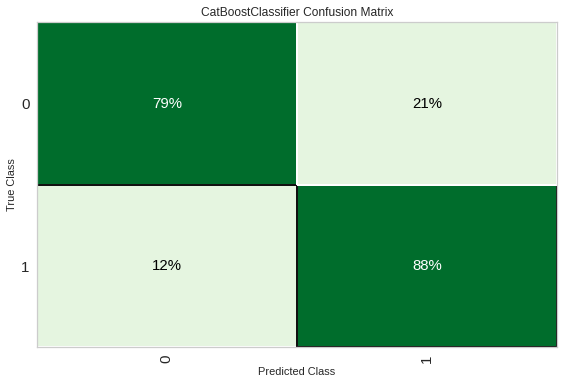

In [ ]:
plot_model(sklearn_tuned_catboost, plot = 'confusion_matrix' ,plot_kwargs = {'percent' : True})

**Optuna Optimization**

In [ ]:
predict_model(optuna_tuned_catboost)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.8435,0.9183,0.8992,0.8056,0.8498,0.6875,0.692


,age,resting bp s,cholesterol,max heart rate,oldpeak,sex_1,chest pain type_1,chest pain type_2,chest pain type_3,chest pain type_4,...,resting ecg_0,resting ecg_1,resting ecg_2,exercise angina_0,ST slope_1,ST slope_2,ST slope_3,target,Label,Score
0,1.147237,1.917789,-0.249627,0.711173,-0.104855,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,1,0.6706
1,0.338208,-0.191934,1.089325,0.878248,-0.895913,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.5166
2,-0.708823,0.334356,0.343909,0.752881,-0.895913,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.9409
3,0.564015,0.437142,0.636867,0.669506,1.081365,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.9219
4,2.757972,-0.408458,-1.610767,-1.111772,1.081365,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,1,0.7563
5,0.117486,1.434466,0.877168,0.296566,0.117365,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.9230
6,0.564015,2.393617,-0.562270,-1.505031,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.8777
7,0.227168,-0.627829,-0.318780,-1.622465,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,0.6789
8,1.508079,-1.413791,-0.336838,0.173177,-0.477955,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.8689
9,-0.306063,1.434466,-1.017480,1.340729,-0.895913,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.9825


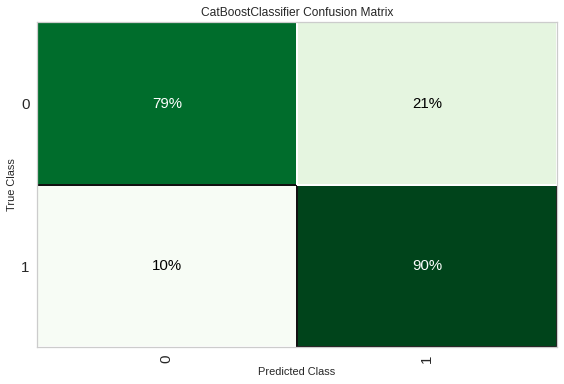

In [ ]:
plot_model(optuna_tuned_catboost, plot = 'confusion_matrix' ,plot_kwargs = {'percent' : True})

**Scikit-optimize**





In [ ]:
predict_model(scikit_opt_tuned_catboost)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.8435,0.9104,0.8915,0.8099,0.8487,0.6874,0.6908


,age,resting bp s,cholesterol,max heart rate,oldpeak,sex_1,chest pain type_1,chest pain type_2,chest pain type_3,chest pain type_4,...,resting ecg_0,resting ecg_1,resting ecg_2,exercise angina_0,ST slope_1,ST slope_2,ST slope_3,target,Label,Score
0,1.147237,1.917789,-0.249627,0.711173,-0.104855,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,1,0.7756
1,0.338208,-0.191934,1.089325,0.878248,-0.895913,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,1,0.7127
2,-0.708823,0.334356,0.343909,0.752881,-0.895913,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.9771
3,0.564015,0.437142,0.636867,0.669506,1.081365,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.9577
4,2.757972,-0.408458,-1.610767,-1.111772,1.081365,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,1,0.8244
5,0.117486,1.434466,0.877168,0.296566,0.117365,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.9719
6,0.564015,2.393617,-0.562270,-1.505031,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.9227
7,0.227168,-0.627829,-0.318780,-1.622465,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,0.8736
8,1.508079,-1.413791,-0.336838,0.173177,-0.477955,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.9399
9,-0.306063,1.434466,-1.017480,1.340729,-0.895913,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.9970


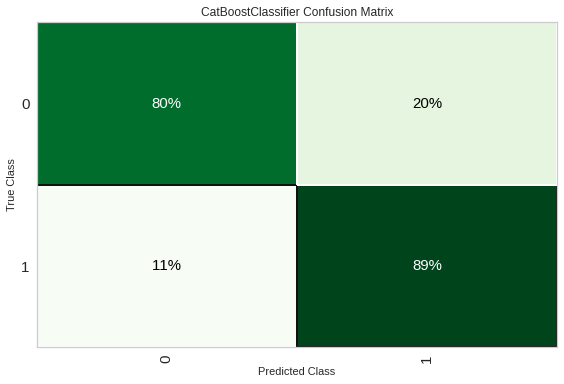

In [ ]:
plot_model(scikit_opt_tuned_catboost, plot = 'confusion_matrix' ,plot_kwargs = {'percent' : True})

## All Random Forest models

**Scikit learn optimization**

In [ ]:
predict_model(sklearn_tuned_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.8473,0.9131,0.8837,0.8201,0.8507,0.6949,0.697


,age,resting bp s,cholesterol,max heart rate,oldpeak,sex_1,chest pain type_1,chest pain type_2,chest pain type_3,chest pain type_4,...,resting ecg_0,resting ecg_1,resting ecg_2,exercise angina_0,ST slope_1,ST slope_2,ST slope_3,target,Label,Score
0,1.147237,1.917789,-0.249627,0.711173,-0.104855,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,1,0.6366
1,0.338208,-0.191934,1.089325,0.878248,-0.895913,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.5145
2,-0.708823,0.334356,0.343909,0.752881,-0.895913,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.9458
3,0.564015,0.437142,0.636867,0.669506,1.081365,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.9407
4,2.757972,-0.408458,-1.610767,-1.111772,1.081365,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,1,0.7188
5,0.117486,1.434466,0.877168,0.296566,0.117365,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.9392
6,0.564015,2.393617,-0.562270,-1.505031,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.8698
7,0.227168,-0.627829,-0.318780,-1.622465,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,0.8114
8,1.508079,-1.413791,-0.336838,0.173177,-0.477955,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.6781
9,-0.306063,1.434466,-1.017480,1.340729,-0.895913,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.9841


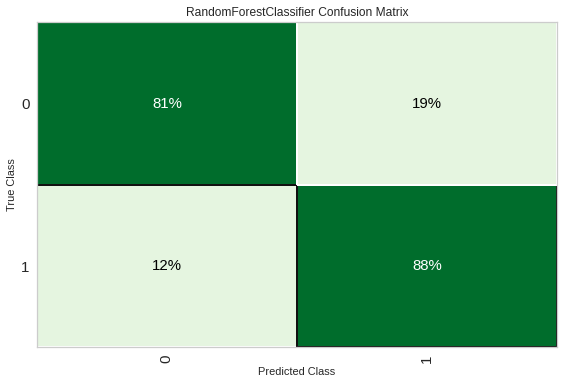

In [ ]:
plot_model(sklearn_tuned_rf, plot = 'confusion_matrix' ,plot_kwargs = {'percent' : True})

**Optuna Optimization**

In [ ]:
predict_model(optuna_tuned_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.8435,0.9114,0.8837,0.8143,0.8476,0.6874,0.6898


,age,resting bp s,cholesterol,max heart rate,oldpeak,sex_1,chest pain type_1,chest pain type_2,chest pain type_3,chest pain type_4,...,resting ecg_0,resting ecg_1,resting ecg_2,exercise angina_0,ST slope_1,ST slope_2,ST slope_3,target,Label,Score
0,1.147237,1.917789,-0.249627,0.711173,-0.104855,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,1,0.71
1,0.338208,-0.191934,1.089325,0.878248,-0.895913,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,1,0.61
2,-0.708823,0.334356,0.343909,0.752881,-0.895913,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.95
3,0.564015,0.437142,0.636867,0.669506,1.081365,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.96
4,2.757972,-0.408458,-1.610767,-1.111772,1.081365,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,1,0.69
5,0.117486,1.434466,0.877168,0.296566,0.117365,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.93
6,0.564015,2.393617,-0.562270,-1.505031,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.88
7,0.227168,-0.627829,-0.318780,-1.622465,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,0.83
8,1.508079,-1.413791,-0.336838,0.173177,-0.477955,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.75
9,-0.306063,1.434466,-1.017480,1.340729,-0.895913,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,1.00


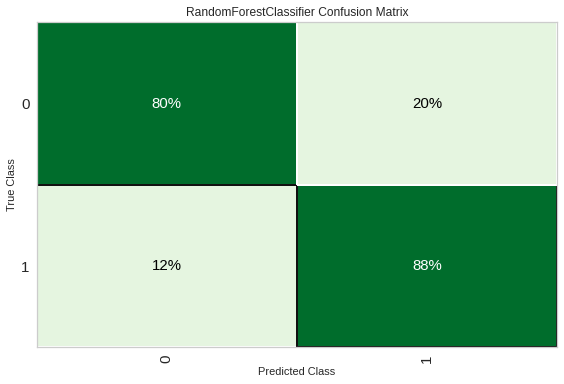

In [ ]:
plot_model(optuna_tuned_rf, plot = 'confusion_matrix' ,plot_kwargs = {'percent' : True})

**Scikit-optimize**

In [ ]:
predict_model(scikit_opt_tuned_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.8473,0.9053,0.907,0.8069,0.854,0.6952,0.7004


,age,resting bp s,cholesterol,max heart rate,oldpeak,sex_1,chest pain type_1,chest pain type_2,chest pain type_3,chest pain type_4,...,resting ecg_0,resting ecg_1,resting ecg_2,exercise angina_0,ST slope_1,ST slope_2,ST slope_3,target,Label,Score
0,1.147237,1.917789,-0.249627,0.711173,-0.104855,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,1,0.7700
1,0.338208,-0.191934,1.089325,0.878248,-0.895913,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,1,0.6325
2,-0.708823,0.334356,0.343909,0.752881,-0.895913,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.9941
3,0.564015,0.437142,0.636867,0.669506,1.081365,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.9782
4,2.757972,-0.408458,-1.610767,-1.111772,1.081365,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,1,0.7222
5,0.117486,1.434466,0.877168,0.296566,0.117365,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.9853
6,0.564015,2.393617,-0.562270,-1.505031,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.9199
7,0.227168,-0.627829,-0.318780,-1.622465,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,0.8513
8,1.508079,-1.413791,-0.336838,0.173177,-0.477955,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.6097
9,-0.306063,1.434466,-1.017480,1.340729,-0.895913,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.9954


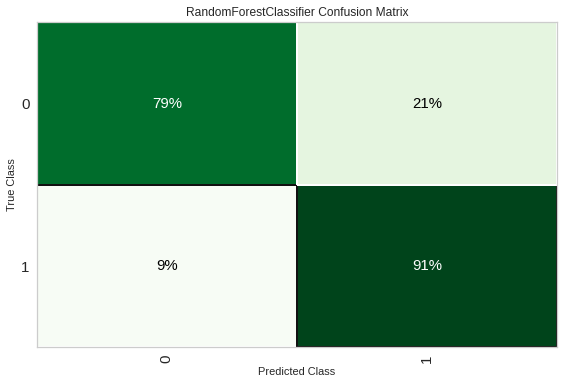

In [ ]:
plot_model(scikit_opt_tuned_rf, plot = 'confusion_matrix' ,plot_kwargs = {'percent' : True})

## All Extra Trees Models

**Scikit learn optimization**

In [ ]:
predict_model(sklearn_tuned_et)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,0.8244,0.8916,0.8682,0.7943,0.8296,0.6493,0.652


,age,resting bp s,cholesterol,max heart rate,oldpeak,sex_1,chest pain type_1,chest pain type_2,chest pain type_3,chest pain type_4,...,resting ecg_0,resting ecg_1,resting ecg_2,exercise angina_0,ST slope_1,ST slope_2,ST slope_3,target,Label,Score
0,1.147237,1.917789,-0.249627,0.711173,-0.104855,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,1,0.63
1,0.338208,-0.191934,1.089325,0.878248,-0.895913,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,1,0.70
2,-0.708823,0.334356,0.343909,0.752881,-0.895913,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.97
3,0.564015,0.437142,0.636867,0.669506,1.081365,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.98
4,2.757972,-0.408458,-1.610767,-1.111772,1.081365,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,1,0.74
5,0.117486,1.434466,0.877168,0.296566,0.117365,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.96
6,0.564015,2.393617,-0.562270,-1.505031,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.92
7,0.227168,-0.627829,-0.318780,-1.622465,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,0.86
8,1.508079,-1.413791,-0.336838,0.173177,-0.477955,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.81
9,-0.306063,1.434466,-1.017480,1.340729,-0.895913,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.99


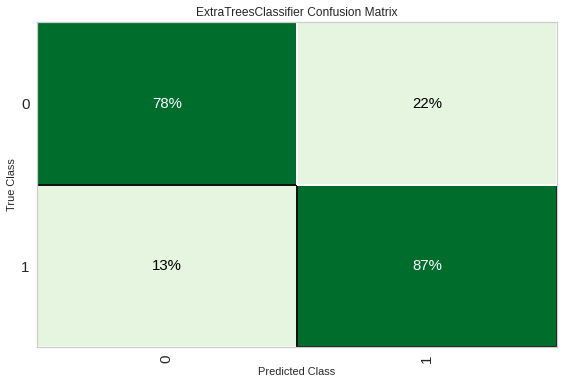

In [ ]:
plot_model(sklearn_tuned_et, plot = 'confusion_matrix' ,plot_kwargs = {'percent' : True})

**Optuna Optimization**

In [ ]:
predict_model(optuna_tuned_et)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,0.8244,0.8916,0.8682,0.7943,0.8296,0.6493,0.652


,age,resting bp s,cholesterol,max heart rate,oldpeak,sex_1,chest pain type_1,chest pain type_2,chest pain type_3,chest pain type_4,...,resting ecg_0,resting ecg_1,resting ecg_2,exercise angina_0,ST slope_1,ST slope_2,ST slope_3,target,Label,Score
0,1.147237,1.917789,-0.249627,0.711173,-0.104855,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,1,0.63
1,0.338208,-0.191934,1.089325,0.878248,-0.895913,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,1,0.70
2,-0.708823,0.334356,0.343909,0.752881,-0.895913,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.97
3,0.564015,0.437142,0.636867,0.669506,1.081365,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.98
4,2.757972,-0.408458,-1.610767,-1.111772,1.081365,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,1,0.74
5,0.117486,1.434466,0.877168,0.296566,0.117365,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.96
6,0.564015,2.393617,-0.562270,-1.505031,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.92
7,0.227168,-0.627829,-0.318780,-1.622465,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,0.86
8,1.508079,-1.413791,-0.336838,0.173177,-0.477955,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.81
9,-0.306063,1.434466,-1.017480,1.340729,-0.895913,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.99


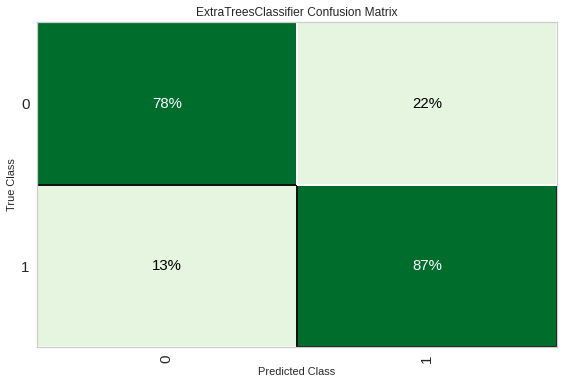

In [ ]:
plot_model(optuna_tuned_et, plot = 'confusion_matrix' ,plot_kwargs = {'percent' : True})

**Scikit-optimize**

In [ ]:
predict_model(scikit_opt_tuned_et)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,0.8244,0.8916,0.8682,0.7943,0.8296,0.6493,0.652


,age,resting bp s,cholesterol,max heart rate,oldpeak,sex_1,chest pain type_1,chest pain type_2,chest pain type_3,chest pain type_4,...,resting ecg_0,resting ecg_1,resting ecg_2,exercise angina_0,ST slope_1,ST slope_2,ST slope_3,target,Label,Score
0,1.147237,1.917789,-0.249627,0.711173,-0.104855,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,1,0.63
1,0.338208,-0.191934,1.089325,0.878248,-0.895913,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,1,0.70
2,-0.708823,0.334356,0.343909,0.752881,-0.895913,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0,0,0.97
3,0.564015,0.437142,0.636867,0.669506,1.081365,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.98
4,2.757972,-0.408458,-1.610767,-1.111772,1.081365,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,1,0.74
5,0.117486,1.434466,0.877168,0.296566,0.117365,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,1,0.96
6,0.564015,2.393617,-0.562270,-1.505031,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.92
7,0.227168,-0.627829,-0.318780,-1.622465,-0.895913,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,1,0.86
8,1.508079,-1.413791,-0.336838,0.173177,-0.477955,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.81
9,-0.306063,1.434466,-1.017480,1.340729,-0.895913,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0.99


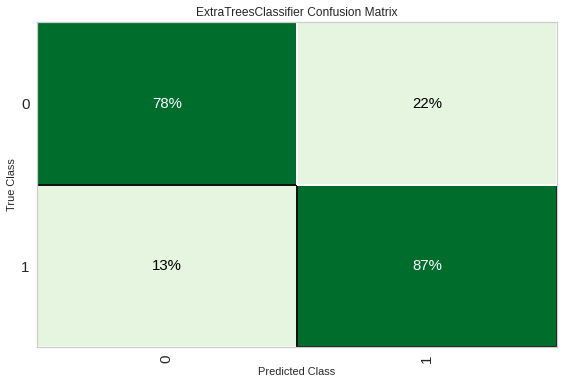

In [ ]:
plot_model(scikit_opt_tuned_et, plot = 'confusion_matrix' ,plot_kwargs = {'percent' : True})

# 6.0 Plot Models

**AUC Plot**

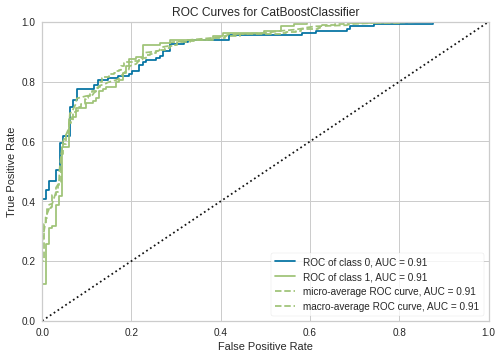

In [ ]:
plot_model(sklearn_tuned_catboost, plot = 'auc')

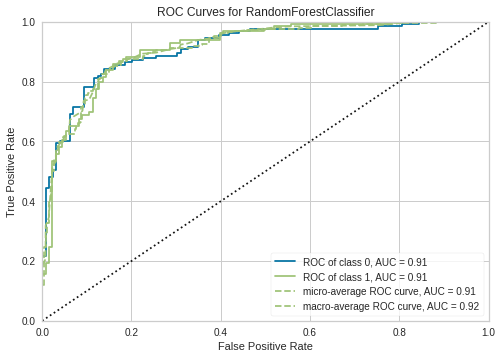

In [ ]:
plot_model(sklearn_tuned_rf, plot = 'auc')

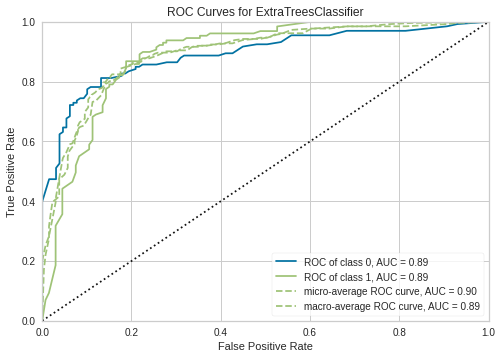

In [ ]:
plot_model(optuna_tuned_et, plot = 'auc')

**Precision-Recall Curve**

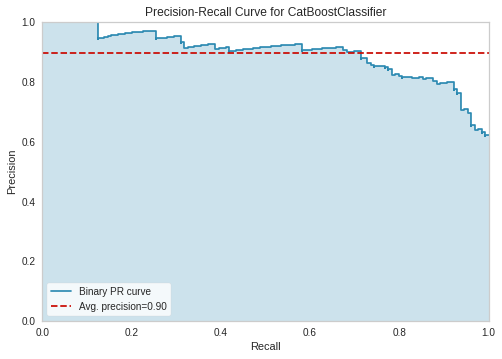

In [ ]:
plot_model(sklearn_tuned_catboost, plot = 'pr')

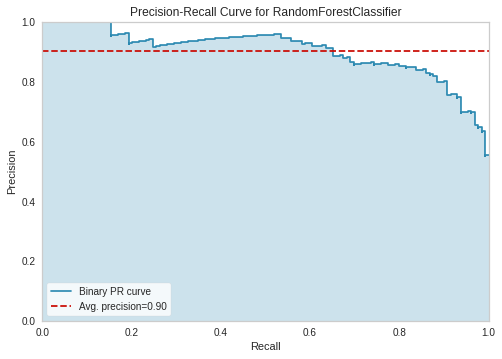

In [ ]:
plot_model(sklearn_tuned_rf, plot = 'pr')

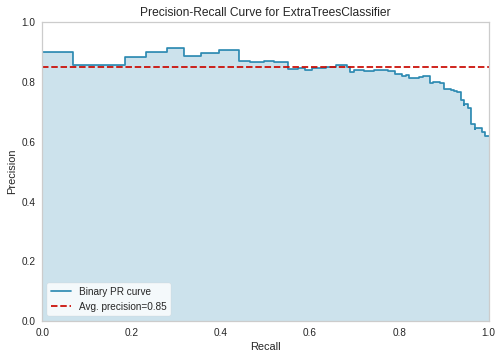

In [ ]:
plot_model(optuna_tuned_et, plot = 'pr')

**Feature Importance Plot**

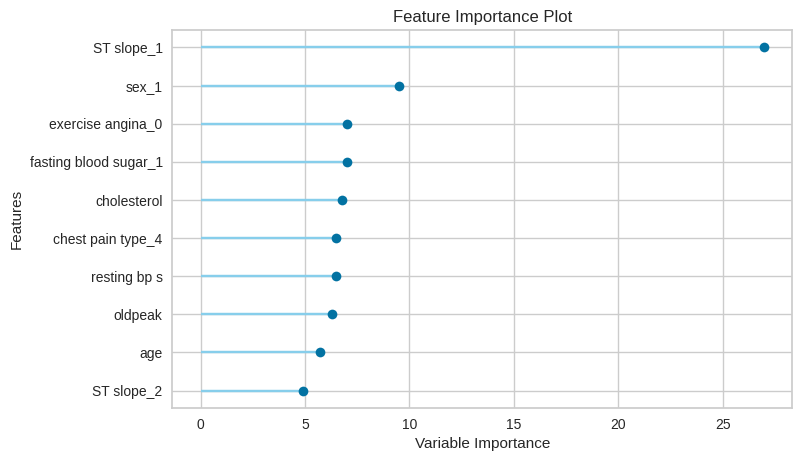

In [ ]:
plot_model(sklearn_tuned_catboost, plot = 'feature')

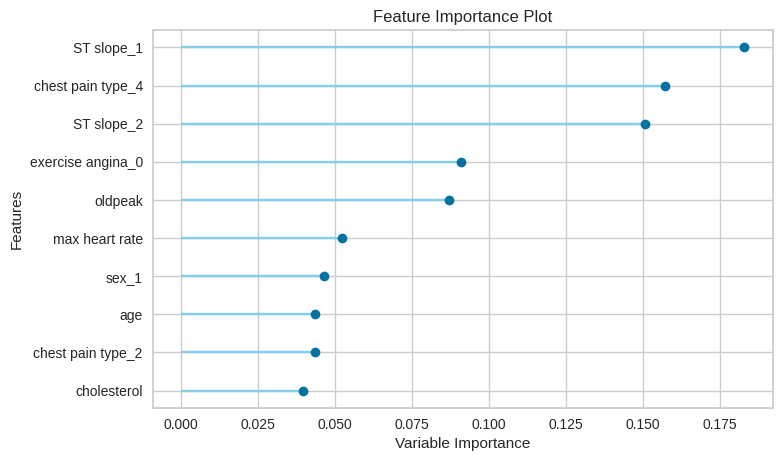

In [ ]:
plot_model(sklearn_tuned_rf, plot = 'feature')

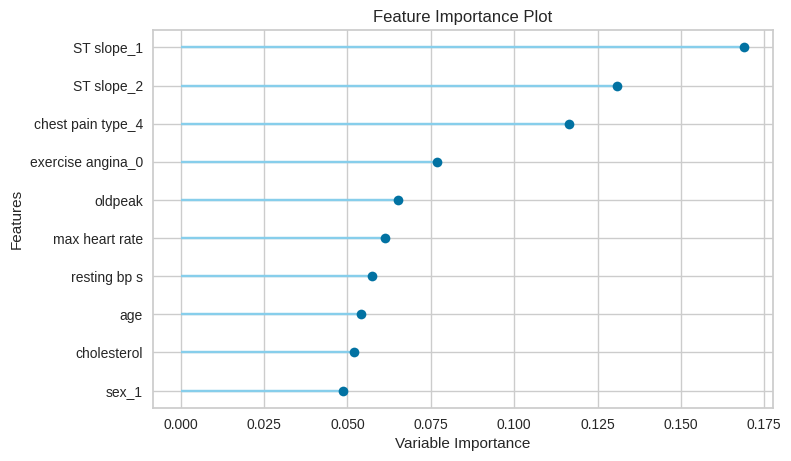

In [ ]:
plot_model(optuna_tuned_et, plot = 'feature')

In [ ]:
evaluate_model(sklearn_tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# 7.0: Finalize Models

In [ ]:
final_catboost = finalize_model(sklearn_tuned_catboost)
final_rf = finalize_model(scikit_opt_tuned_rf)
final_et = finalize_model(optuna_tuned_et)

In [ ]:
print(sklearn_tuned_catboost.get_all_params())

{'nan_mode': 'Min', 'eval_metric': 'Logloss', 'iterations': 40, 'sampling_frequency': 'PerTree', 'leaf_estimation_method': 'Newton', 'grow_policy': 'SymmetricTree', 'penalties_coefficient': 1, 'boosting_type': 'Plain', 'model_shrink_mode': 'Constant', 'feature_border_type': 'GreedyLogSum', 'bayesian_matrix_reg': 0.10000000149011612, 'force_unit_auto_pair_weights': False, 'l2_leaf_reg': 8, 'random_strength': 0.800000011920929, 'rsm': 1, 'boost_from_average': False, 'model_size_reg': 0.5, 'pool_metainfo_options': {'tags': {}}, 'subsample': 0.800000011920929, 'use_best_model': False, 'class_names': [0, 1], 'random_seed': 2701, 'depth': 9, 'posterior_sampling': False, 'border_count': 254, 'classes_count': 0, 'auto_class_weights': 'None', 'sparse_features_conflict_fraction': 0, 'leaf_estimation_backtracking': 'AnyImprovement', 'best_model_min_trees': 1, 'model_shrink_rate': 0, 'min_data_in_leaf': 1, 'loss_function': 'Logloss', 'learning_rate': 0.5, 'score_function': 'Cosine', 'task_type': '

In [ ]:
print(scikit_opt_tuned_rf)

RandomForestClassifier(bootstrap=False, class_weight='balanced', max_depth=10,
                       max_features='log2', min_impurity_decrease=0,
                       min_samples_leaf=3, min_samples_split=10,
                       n_estimators=150, n_jobs=-1, random_state=2701)


In [ ]:
print(optuna_tuned_et)

ExtraTreesClassifier(n_jobs=-1, random_state=2701)


In [ ]:
predict_model(final_catboost);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.9542,0.9902,0.9612,0.9466,0.9538,0.9084,0.9085


In [ ]:
predict_model(final_rf);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9771,0.9984,0.9845,0.9695,0.9769,0.9542,0.9543


In [ ]:
predict_model(final_et);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
predict_model(final_catboost, data = data_unseen);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.9348,0.9792,0.9583,0.92,0.9388,0.8691,0.8699


In [ ]:
predict_model(final_rf, data = data_unseen);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9565,0.9754,1.0,0.9231,0.96,0.9125,0.9161


In [ ]:
predict_model(final_et, data = data_unseen);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,0.8696,0.9735,0.9167,0.8462,0.88,0.7376,0.7405


In [ ]:
save_model(final_rf, 'my_best_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(steps=[('dtypes',
                  DataTypes_Auto_infer(ml_usecase='classification',
                                       target='target')),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='mean',
                                 target_variable=None)),
                 ('new_levels1',
                  New_Catagorical_Levels_in_TestData(replacement_strategy='least '
                                                                          'frequent',
                                                     targ...
                  Fix_multicollinearity(correlation_with_target_preference=None,
                                        target_variable='target',
                                        threshold=0.9)),
                 ('dfs', 'passthrough'), (

In [ ]:
save_model(final_catboost, 'best_catboost')

Transformation Pipeline and Model Successfully Saved


(Pipeline(steps=[('dtypes',
                  DataTypes_Auto_infer(ml_usecase='classification',
                                       target='target')),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='mean',
                                 target_variable=None)),
                 ('new_levels1',
                  New_Catagorical_Levels_in_TestData(replacement_strategy='least '
                                                                          'frequent',
                                                     targ...
                 ('dummy', Dummify(target='target')),
                 ('fix_perfect', Remove_100(target='target')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'),
                 ('fix

In [ ]:
save_model(final_et, 'best_extratrees')

Transformation Pipeline and Model Successfully Saved


(Pipeline(steps=[('dtypes',
                  DataTypes_Auto_infer(ml_usecase='classification',
                                       target='target')),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='mean',
                                 target_variable=None)),
                 ('new_levels1',
                  New_Catagorical_Levels_in_TestData(replacement_strategy='least '
                                                                          'frequent',
                                                     targ...
                 ('dummy', Dummify(target='target')),
                 ('fix_perfect', Remove_100(target='target')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'),
                 ('fix

# Interpret Models - SHAP Method

**Load Models (if necessary)**

In [ ]:
from pycaret.classification import load_model

#final_rf = load_model('my_best_pipeline')
#final_catboost = load_model('best_catboost')
final_et = load_model('best_extratrees')

Transformation Pipeline and Model Successfully Loaded


In [ ]:
help(get_config)

Help on function get_config in module pycaret.classification:

get_config(variable: str)
    This function retrieves the global variables created when initializing the
    ``setup`` function. Following variables are accessible:
    
    - X: Transformed dataset (X)
    - y: Transformed dataset (y)
    - X_train: Transformed train dataset (X)
    - X_test: Transformed test/holdout dataset (X)
    - y_train: Transformed train dataset (y)
    - y_test: Transformed test/holdout dataset (y)
    - seed: random state set through session_id
    - prep_pipe: Transformation pipeline
    - fold_shuffle_param: shuffle parameter used in Kfolds
    - n_jobs_param: n_jobs parameter used in model training
    - html_param: html_param configured through setup
    - create_model_container: results grid storage container
    - master_model_container: model storage container
    - display_container: results display container
    - exp_name_log: Name of experiment
    - logging_param: log_experiment param


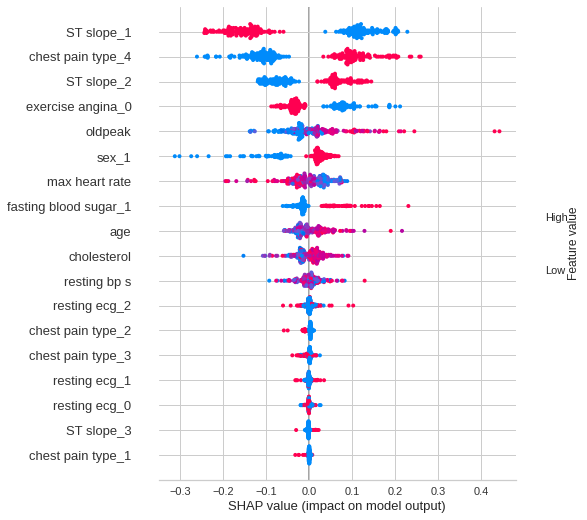

In [ ]:
# interpret model

#GLOBAL EXPLANATION

from pycaret.classification import *

interpret_model(final_rf)

In [ ]:
#Shap library
!pip install shap


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import shap 

# Create Tree Explainer object that can calculate shap values

explainer = shap.TreeExplainer(final_rf)

In [ ]:
test_data = get_config(variable="X_test")
choosen_instance = test_data.iloc[1]
choosen_instance

age                      0.338208
resting bp s            -0.191934
cholesterol              1.089325
max heart rate           0.878248
oldpeak                 -0.895913
sex_1                    0.000000
chest pain type_1        0.000000
chest pain type_2        0.000000
chest pain type_3        0.000000
chest pain type_4        1.000000
fasting blood sugar_1    0.000000
resting ecg_0            0.000000
resting ecg_1            0.000000
resting ecg_2            1.000000
exercise angina_0        1.000000
ST slope_1               1.000000
ST slope_2               0.000000
ST slope_3               0.000000
Name: 291, dtype: float32

In [ ]:
shap_values = explainer.shap_values(choosen_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)

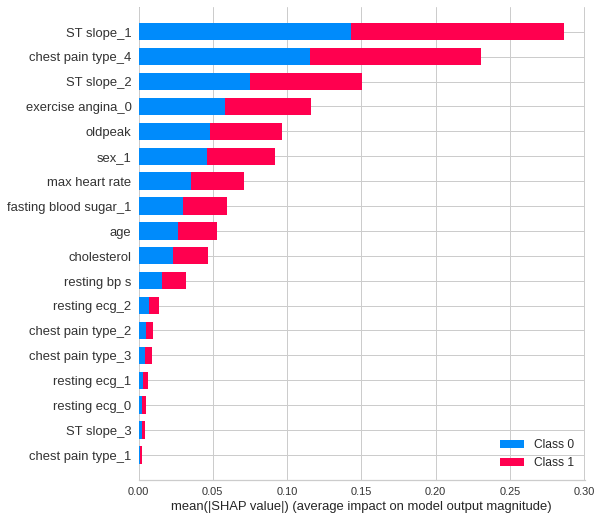

In [ ]:
#https://github.com/slundberg/shap

#GLOBAL EXPLANATION!

shap.initjs()

shap_values = explainer.shap_values(test_data)

shap.summary_plot(shap_values, test_data)

In [ ]:
shap.initjs()

shap.plots.force(explainer.expected_value[1],shap_values[1])

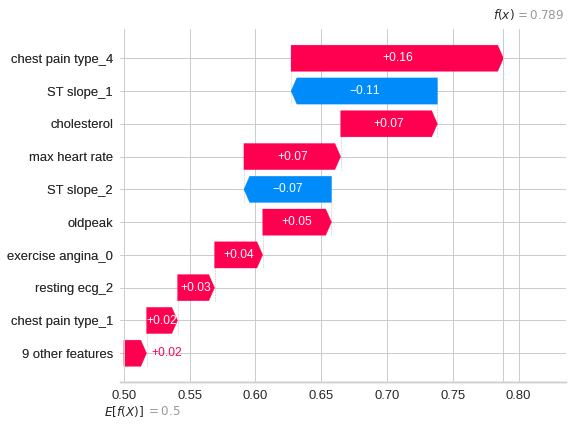

In [ ]:
shap.waterfall_plot(shap.Explanation(values=shap_values[0][0], 
                                         base_values=explainer.expected_value[0], 
                                         feature_names=test_data.columns.tolist()))

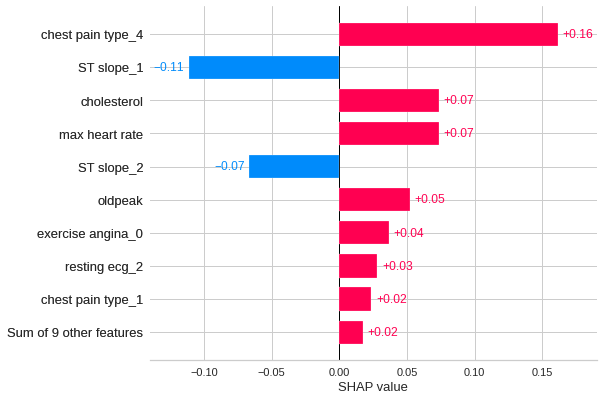

In [ ]:
shap.plots.bar(shap.Explanation(values=shap_values[0][0], 
                                         base_values=explainer.expected_value[0], 
                                         feature_names=test_data.columns.tolist()))

# DeepChecks


In [ ]:
#!pip install deepchecks

deep_check(tuned_catboost)